In [1]:
pip install pycaret

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install interpret

In [3]:
pip install lime

In [4]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


In [5]:
import numpy as np
import pandas as ps
import seaborn as sns
from interpret import show
from interpret.data import Marginal
from interpret.glassbox import ExplainableBoostingClassifier
from interpret.blackbox import LimeTabular, ShapKernel, MorrisSensitivity, PartialDependence
import lime
import lime.lime_tabular
from interpret.perf import ROC

# Charger le jeu de données
import pandas as pd
from pycaret.datasets import get_data
from pycaret.classification import *

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.gridspec as grid_spec
import seaborn as sns
from imblearn.over_sampling import SMOTE
import scikitplot as skplt

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score

from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, precision_score, f1_score
import warnings
warnings.filterwarnings('ignore')
!pip install pywaffle

   ---------------------------------------- 0.0/25.6 MB ? eta -:--:--
   ---------------------------------------- 0.3/25.6 MB 6.5 MB/s eta 0:00:04
   - -------------------------------------- 0.9/25.6 MB 9.2 MB/s eta 0:00:03
   - -------------------------------------- 1.2/25.6 MB 9.5 MB/s eta 0:00:03
   -- ------------------------------------- 1.8/25.6 MB 9.8 MB/s eta 0:00:03
   --- ------------------------------------ 2.4/25.6 MB 10.3 MB/s eta 0:00:03
   ---- ----------------------------------- 2.9/25.6 MB 10.1 MB/s eta 0:00:03
   ----- ---------------------------------- 3.3/25.6 MB 10.1 MB/s eta 0:00:03
   ----- ---------------------------------- 3.7/25.6 MB 9.8 MB/s eta 0:00:03
   ------ --------------------------------- 3.9/25.6 MB 9.5 MB/s eta 0:00:03
   ------ --------------------------------- 4.4/25.6 MB 9.4 MB/s eta 0:00:03
   ------- -------------------------------- 4.8/25.6 MB 9.2 MB/s eta 0:00:03
   ------- -------------------------------- 5.1/25.6 MB 9.0 MB/s eta 0:00:03
   

In [7]:
df=pd.read_csv('healthcare-dataset-stroke-data (1).csv')
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [9]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [10]:
df.isnull().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [11]:
DT_bmi_pipe = Pipeline( steps=[ 
                               ('scale',StandardScaler()),
                               ('lr',DecisionTreeRegressor(random_state=42))
                              ])
X = df[['age','gender','bmi']].copy()
X.gender = X.gender.replace({'Male':0,'Female':1,'Other':-1}).astype(np.uint8)

Missing = X[X.bmi.isna()]
X = X[~X.bmi.isna()]
Y = X.pop('bmi')
DT_bmi_pipe.fit(X,Y)
predicted_bmi = pd.Series(DT_bmi_pipe.predict(Missing[['age','gender']]),index=Missing.index)
df.loc[Missing.index,'bmi'] = predicted_bmi

In [12]:
df.isnull().sum()

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [13]:
#plot graph for individual columns

<AxesSubplot: xlabel='gender', ylabel='count'>

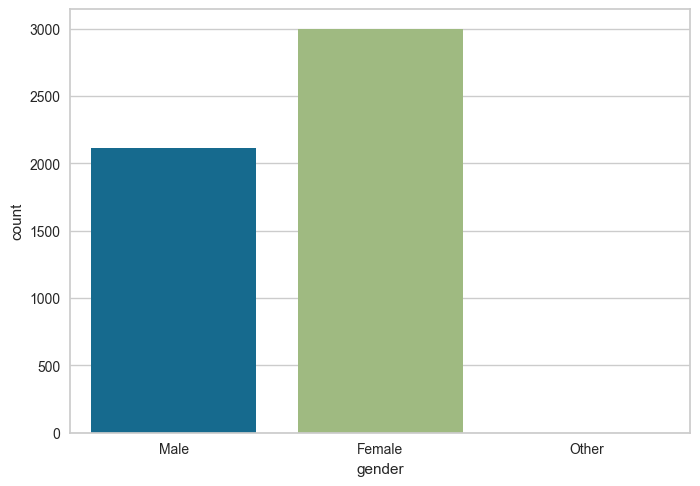

In [14]:
sns.countplot(x=df['gender'])

<AxesSubplot: xlabel='ever_married', ylabel='count'>

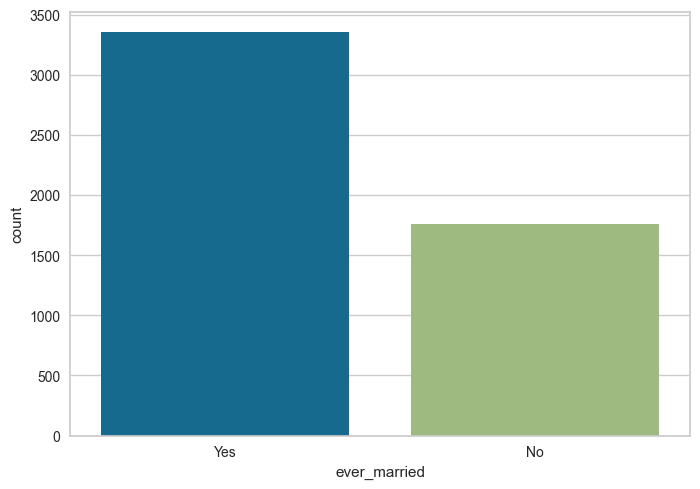

In [15]:
sns.countplot(x=df['ever_married'])

<AxesSubplot: xlabel='work_type', ylabel='count'>

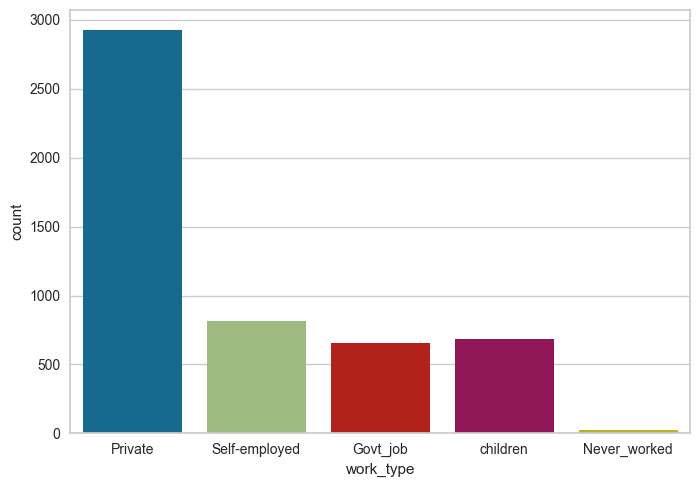

In [16]:
sns.countplot(x=df['work_type'])

<AxesSubplot: xlabel='Residence_type', ylabel='count'>

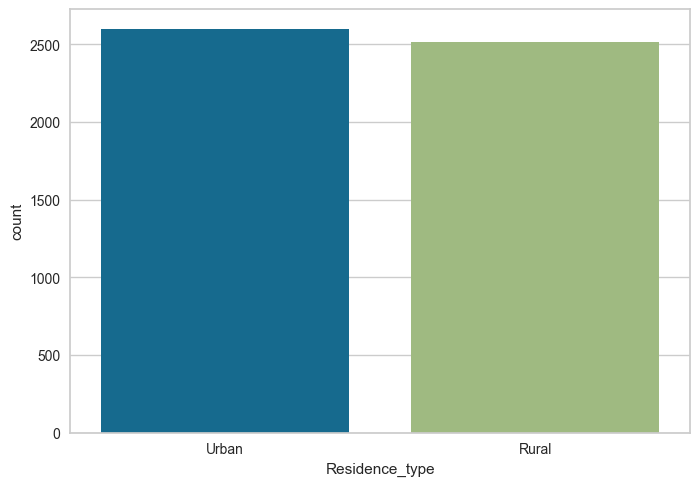

In [17]:
sns.countplot(x=df['Residence_type'])

<AxesSubplot: xlabel='smoking_status', ylabel='count'>

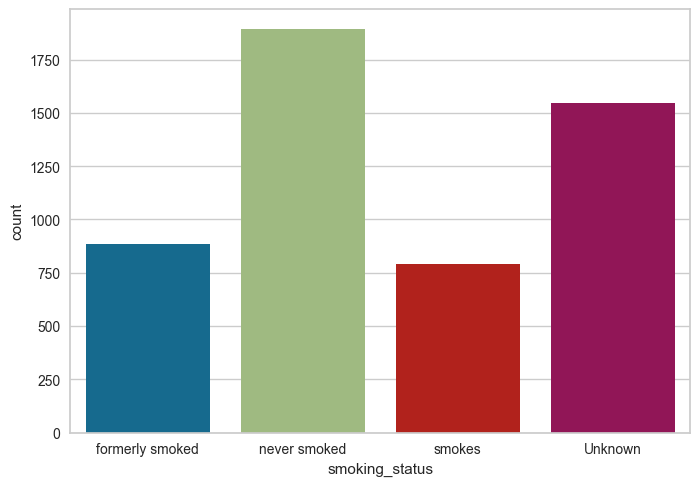

In [18]:
sns.countplot(x=df['smoking_status'])

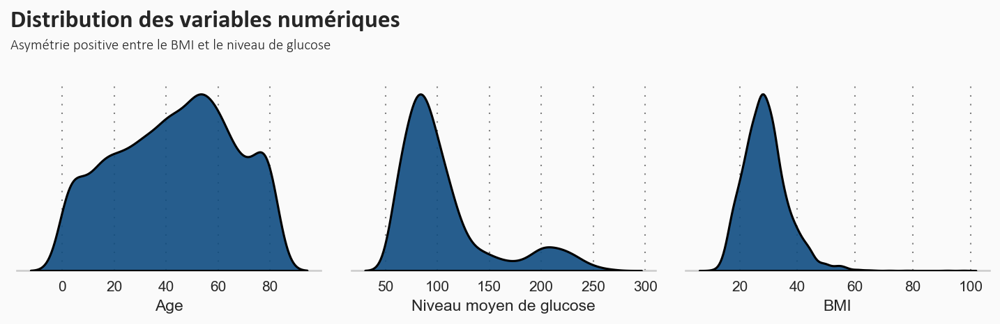

In [19]:
variables = [variable for variable in df.columns if variable not in ['id','stroke']]
conts = ['age','avg_glucose_level','bmi']


fig = plt.figure(figsize=(12, 12), dpi=150, facecolor='#fafafa')
gs = fig.add_gridspec(4, 3)
gs.update(wspace=0.1, hspace=0.4)

background_color = "#fafafa"

plot = 0
for row in range(0, 1):
    for col in range(0, 3):
        locals()["ax"+str(plot)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(plot)].set_facecolor(background_color)
        locals()["ax"+str(plot)].tick_params(axis='y', left=False)
        locals()["ax"+str(plot)].get_yaxis().set_visible(False)
        for s in ["top","right","left"]:
            locals()["ax"+str(plot)].spines[s].set_visible(False)
        plot += 1

plot = 0
for variable in conts:
        sns.kdeplot(df[variable] ,ax=locals()["ax"+str(plot)], color='#0f4c81', shade=True, linewidth=1.5, ec='black',alpha=0.9, zorder=3, legend=False)
        locals()["ax"+str(plot)].grid(which='major', axis='x', zorder=0, color='gray', linestyle=':', dashes=(1,5))
        #locals()["ax"+str(plot)].set_xlabel(variable) removed this for aesthetics
        plot += 1
        
ax0.set_xlabel('Age')
ax1.set_xlabel('Niveau moyen de glucose')
ax2.set_xlabel('BMI')

ax0.text(-20, 0.022, 'Distribution des variables numériques', fontsize=17, fontweight='bold', fontfamily='calibri')
ax0.text(-20, 0.02, 'Asymétrie positive entre le BMI et le niveau de glucose', fontsize=10, fontweight='light', fontfamily='calibri')

plt.show()

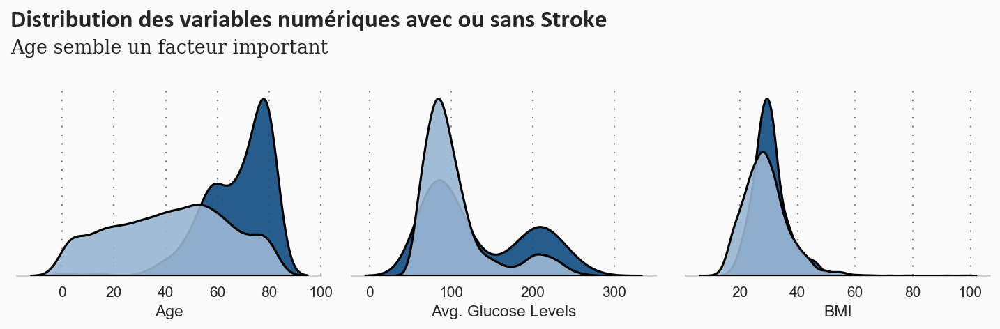

In [20]:
fig = plt.figure(figsize=(12, 12), dpi=150,facecolor=background_color)
gs = fig.add_gridspec(4, 3)
gs.update(wspace=0.1, hspace=0.4)


plot = 0
for row in range(0, 1):
    for col in range(0, 3):
        locals()["ax"+str(plot)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(plot)].set_facecolor(background_color)
        locals()["ax"+str(plot)].tick_params(axis='y', left=False)
        locals()["ax"+str(plot)].get_yaxis().set_visible(False)
        for s in ["top","right","left"]:
            locals()["ax"+str(plot)].spines[s].set_visible(False)
        plot += 1

plot = 0

s = df[df['stroke'] == 1]
ns = df[df['stroke'] == 0]

for feature in conts:
        sns.kdeplot(s[feature], ax=locals()["ax"+str(plot)], color='#0f4c81', shade=True, linewidth=1.5, ec='black',alpha=0.9, zorder=3, legend=False)
        sns.kdeplot(ns[feature],ax=locals()["ax"+str(plot)], color='#9bb7d4', shade=True, linewidth=1.5, ec='black',alpha=0.9, zorder=3, legend=False)
        locals()["ax"+str(plot)].grid(which='major', axis='x', zorder=0, color='gray', linestyle=':', dashes=(1,5))
        #locals()["ax"+str(plot)].set_xlabel(feature)
        plot += 1

ax0.set_xlabel('Age')
ax1.set_xlabel('Avg. Glucose Levels')
ax2.set_xlabel('BMI')
        
ax0.text(-20, 0.056, 'Distribution des variables numériques avec ou sans Stroke', fontsize=17, fontweight='bold', fontfamily='calibri')
ax0.text(-20, 0.05, 'Age semble un facteur important', fontsize=13, fontweight='light', fontfamily='serif')

plt.show()

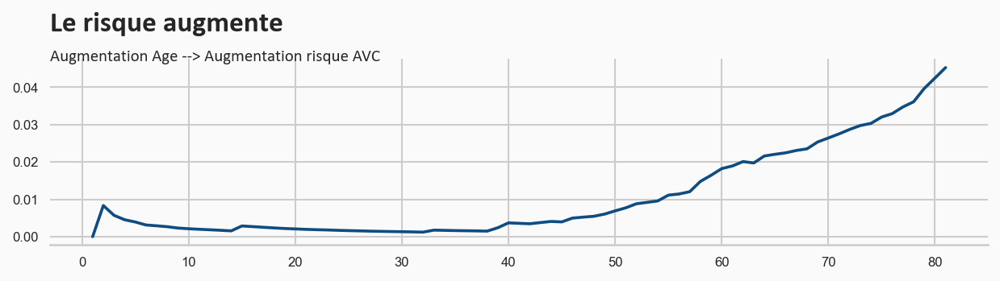

In [21]:
fig = plt.figure(figsize=(10, 5), dpi=150,facecolor=background_color)
gs = fig.add_gridspec(2, 1)
gs.update(wspace=0.11, hspace=0.5)
ax0 = fig.add_subplot(gs[0, 0])
ax0.set_facecolor(background_color)


df['age'] = df['age'].astype(int)

rate = []
for i in range(df['age'].min(), df['age'].max()):
    rate.append(df[df['age'] < i]['stroke'].sum() / len(df[df['age'] < i]['stroke']))

sns.lineplot(data=rate,color='#0f4c81',ax=ax0)

for s in ["top","right","left"]:
    ax0.spines[s].set_visible(False)
ax0.tick_params(axis='both', which='major', labelsize=8)
ax0.tick_params(axis=u'both', which=u'both',length=0)
ax0.text(-3,0.055,'Le risque augmente',fontsize=17,fontfamily='calibri',fontweight='bold')
ax0.text(-3,0.047,'Augmentation Age --> Augmentation risque AVC',fontsize=10,fontfamily='calibri')

plt.show()

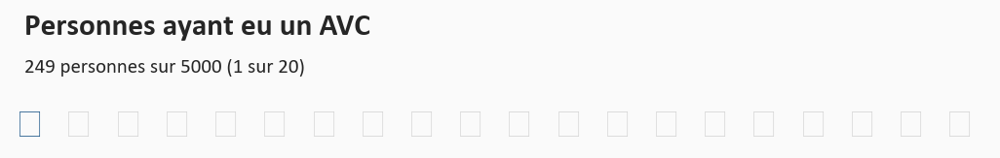

In [22]:
from pywaffle import Waffle

fig = plt.figure(figsize=(7, 2),dpi=150,facecolor=background_color,
    FigureClass=Waffle,
    rows=1,
    values=[1, 19],
    colors=['#0f4c81', "lightgray"],
    characters='⬤',
    font_size=20,vertical=True,
)

fig.text(0.035,0.78,'Personnes ayant eu un AVC',fontfamily='calibri',fontsize=15,fontweight='bold')
fig.text(0.035,0.65,'249 personnes sur 5000 (1 sur 20)',fontfamily='calibri',fontsize=10)

plt.show()

In [23]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [24]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67,0,1,Yes,Private,Urban,228.69,36.600000,formerly smoked,1
1,51676,Female,61,0,0,Yes,Self-employed,Rural,202.21,29.879487,never smoked,1
2,31112,Male,80,0,1,Yes,Private,Rural,105.92,32.500000,never smoked,1
3,60182,Female,49,0,0,Yes,Private,Urban,171.23,34.400000,smokes,1
4,1665,Female,79,1,0,Yes,Self-employed,Rural,174.12,24.000000,never smoked,1


In [25]:
a=pd.get_dummies(df.gender)
b=pd.get_dummies(df.ever_married)
c=pd.get_dummies(df.work_type)
d=pd.get_dummies(df.Residence_type)
e=pd.get_dummies(df.smoking_status)

In [26]:
merged=pd.concat([df, a, b, c, d, e,], axis='columns')
merged.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,...,Never_worked,Private,Self-employed,children,Rural,Urban,Unknown,formerly smoked,never smoked,smokes
0,9046,Male,67,0,1,Yes,Private,Urban,228.69,36.600000,...,0,1,0,0,0,1,0,1,0,0
1,51676,Female,61,0,0,Yes,Self-employed,Rural,202.21,29.879487,...,0,0,1,0,1,0,0,0,1,0
2,31112,Male,80,0,1,Yes,Private,Rural,105.92,32.500000,...,0,1,0,0,1,0,0,0,1,0
3,60182,Female,49,0,0,Yes,Private,Urban,171.23,34.400000,...,0,1,0,0,0,1,0,0,0,1
4,1665,Female,79,1,0,Yes,Self-employed,Rural,174.12,24.000000,...,0,0,1,0,1,0,0,0,1,0


In [27]:
data=merged.drop(['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status', 'Male', 'Yes', 'Private', 'Urban', 'formerly smoked'], axis='columns')
data.head()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,Female,Other,No,Govt_job,Never_worked,Self-employed,children,Rural,Unknown,never smoked,smokes
0,9046,67,0,1,228.69,36.600000,1,0,0,0,0,0,0,0,0,0,0,0
1,51676,61,0,0,202.21,29.879487,1,1,0,0,0,0,1,0,1,0,1,0
2,31112,80,0,1,105.92,32.500000,1,0,0,0,0,0,0,0,1,0,1,0
3,60182,49,0,0,171.23,34.400000,1,1,0,0,0,0,0,0,0,0,0,1
4,1665,79,1,0,174.12,24.000000,1,1,0,0,0,0,1,0,1,0,1,0


In [28]:
data.drop(['id'],inplace=True,axis=1)

In [29]:
dff=data.apply(le.fit_transform)

In [30]:
x=dff.drop('stroke', axis='columns')
y=dff.stroke

In [31]:
from sklearn.model_selection import train_test_split

In [36]:
X_train, X_test, y_train, y_test=train_test_split(x, y, test_size=0.2)

In [37]:
y_train.value_counts()

0    3897
1     191
Name: stroke, dtype: int64

In [38]:

oversample = SMOTE()
X_train_resh, y_train_resh = oversample.fit_resample(X_train, y_train.ravel())

In [47]:

oversample = SMOTE()
X_test_resh, y_test_resh = oversample.fit_resample(X_test, y_test.ravel())

In [41]:
dff.head()

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,Female,Other,No,Govt_job,Never_worked,Self-employed,children,Rural,Unknown,never smoked,smokes
0,67,0,1,3850,349,1,0,0,0,0,0,0,0,0,0,0,0
1,61,0,0,3588,215,1,1,0,0,0,0,1,0,1,0,1,0
2,80,0,1,2483,294,1,0,0,0,0,0,0,0,1,0,1,0
3,49,0,0,3385,325,1,1,0,0,0,0,0,0,0,0,0,1
4,79,1,0,3394,127,1,1,0,0,0,0,1,0,1,0,1,0


In [40]:
import pandas as pd

# Convertir le tableau NumPy en objet Pandas Series
y_train_series = pd.Series(y_train_resh)

# Obtenir le décompte des valeurs
value_counts = y_train_series.value_counts()

# Afficher les décomptes
print(value_counts)


0    3897
1    3897
dtype: int64


# prediction avec pycaret

In [42]:
from interpret import show
from interpret.data import Marginal
from interpret.glassbox import ExplainableBoostingClassifier
from interpret.blackbox import LimeTabular, ShapKernel, MorrisSensitivity, PartialDependence
import lime
import lime.lime_tabular
from interpret.perf import ROC
# Charger le jeu de données
import pandas as pd
from pycaret.datasets import get_data

from pycaret.regression import *


# Initialiser l'environnement PyCaret
clf1 = setup(data=dff, target='stroke')

# Créer et comparer plusieurs modèles
models_to_compare = ['lr', 'dt', 'rf', 'ada', 'knn']

# Sélectionner les meilleurs modèles en fonction de la métrique MAE
best_model = compare_models(include=models_to_compare, sort='MAE')

# Afficher le modèle sélectionné
print(best_model)

# Évaluer le modèle sur l'ensemble de test
evaluate_model(best_model)


,Description,Value
0,Session id,6133
1,Target,stroke
2,Target type,Regression
3,Original data shape,"(5110, 17)"
4,Transformed data shape,"(5110, 17)"
5,Transformed train set shape,"(3577, 17)"
6,Transformed test set shape,"(1533, 17)"
7,Numeric features,16
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ada,AdaBoost Regressor,0.0850,0.0435,0.2078,0.0178,0.1464,0.8798,0.0360
dt,Decision Tree Regressor,0.0861,0.0861,0.2928,-1.0032,0.2030,0.8295,0.0290
rf,Random Forest Regressor,0.0897,0.0464,0.2143,-0.0458,0.1541,0.8523,0.3770
lr,Linear Regression,0.0925,0.0418,0.2035,0.0606,0.1429,0.8802,1.4980


AdaBoostRegressor(random_state=6133)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [43]:
# Create and compare multiple models
models_to_compare = ['lr', 'dt', 'rf', 'ada', 'knn']

for model_name in models_to_compare:
    # Creating a model
    current_model = create_model(model_name)
    
    # Train the model
    current_model.fit(X_train, y_train)

    # Create a blackbox model using the trained model
    blackbox_model = current_model

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0899,0.0408,0.2021,0.0970,0.1409,0.8701
1,0.0759,0.0282,0.1679,0.0529,0.1204,0.8645
2,0.0990,0.0492,0.2219,0.1082,0.1530,0.8709
3,0.0968,0.0438,0.2093,0.0315,0.1480,0.8931
4,0.0813,0.0285,0.1688,-0.0499,0.1234,0.8969
5,0.0873,0.0388,0.1971,0.0902,0.1381,0.8704
6,0.1071,0.0574,0.2395,0.0826,0.1651,0.8870
7,0.0972,0.0422,0.2055,0.0135,0.1462,0.8929
8,0.0955,0.0434,0.2083,0.0938,0.1450,0.8734


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0754,0.0754,0.2746,-0.6674,0.1904,0.7059
1,0.0810,0.0810,0.2846,-1.7199,0.1973,0.7273
2,0.0698,0.0698,0.2643,-0.2647,0.1832,0.5714
3,0.0838,0.0838,0.2895,-0.8527,0.2007,0.9412
4,0.0726,0.0726,0.2695,-1.6747,0.1868,0.9000
5,0.1034,0.1034,0.3215,-1.4207,0.2229,0.9375
6,0.1034,0.1034,0.3215,-0.6524,0.2229,0.9583
7,0.0812,0.0812,0.2850,-0.8975,0.1976,0.8750
8,0.0980,0.0980,0.3131,-1.0477,0.2171,0.8889


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0864,0.0453,0.2129,-0.0017,0.1520,0.8318
1,0.0722,0.0320,0.1789,-0.0743,0.1314,0.8400
2,0.0908,0.0494,0.2222,0.1057,0.1553,0.8300
3,0.0899,0.0465,0.2156,-0.0278,0.1548,0.8741
4,0.0757,0.0322,0.1796,-0.1875,0.1338,0.8530
5,0.0918,0.0482,0.2195,-0.1289,0.1588,0.8662
6,0.1047,0.0625,0.2500,0.0011,0.1768,0.8708
7,0.0976,0.0484,0.2199,-0.1295,0.1601,0.8575
8,0.0903,0.0461,0.2146,0.0380,0.1528,0.8422


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0817,0.0441,0.2101,0.0243,0.1468,0.8547
1,0.0702,0.0308,0.1756,-0.0353,0.1275,0.8834
2,0.0929,0.0512,0.2262,0.0733,0.1575,0.8726
3,0.0861,0.0437,0.2090,0.0339,0.1479,0.8841
4,0.0784,0.0313,0.1769,-0.1531,0.1316,0.8939
5,0.0839,0.0413,0.2032,0.0324,0.1431,0.8436
6,0.1019,0.0573,0.2393,0.0846,0.1654,0.8780
7,0.0830,0.0417,0.2042,0.0263,0.1442,0.9015
8,0.0821,0.0450,0.2121,0.0607,0.1470,0.9012


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
1,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
2,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
3,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
4,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
5,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
6,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
7,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000
8,-0.0000,-0.0000,-0.0000,0.0000,-0.0000,-0.0000


# Application de l'ia explicable

# Local Explanations: How an individual prediction was made

In [48]:
 # Explainability using LIME
for model_name in models_to_compare:
    # Train the model
    current_model.fit(X_train_resh, y_train_resh)
    # Create a blackbox model using the trained model
    blackbox_model = current_model
    lime = LimeTabular(blackbox_model, X_train_resh, random_state=1)
    lime_local = lime.explain_local(X_test_resh[:5], y_test_resh[:5], name=f'LIME_{model_name}')
    show(lime_local, 0)

<!-- http://127.0.0.1:7859/1878416919312/ -->

<!-- http://127.0.0.1:7859/1878696782544/ -->

<!-- http://127.0.0.1:7859/1878732833168/ -->

<!-- http://127.0.0.1:7859/1878738215248/ -->

<!-- http://127.0.0.1:7859/1878654654288/ -->

In [49]:
 # SHAP explanation
for model_name in models_to_compare:
    # Train the model
    current_model.fit(X_train_resh, y_train_resh)
    # Create a blackbox model using the trained model
    blackbox_model = current_model
    background_val = pd.DataFrame(np.median(X_train_resh, axis=0).reshape(1, -1), columns=x.columns)
    shap = ShapKernel(blackbox_model, background_val)
    shap_local = shap.explain_local(X_test_resh[:5], y_test_resh[:5], name=f'SHAP_{model_name}')
    show(shap_local, 0)


  0%|          | 0/5 [00:00<?, ?it/s]

<!-- http://127.0.0.1:7859/1877052881360/ -->

  0%|          | 0/5 [00:00<?, ?it/s]

<!-- http://127.0.0.1:7859/1877053060048/ -->

  0%|          | 0/5 [00:00<?, ?it/s]

<!-- http://127.0.0.1:7859/1878732775952/ -->

  0%|          | 0/5 [00:00<?, ?it/s]

<!-- http://127.0.0.1:7859/1877053500688/ -->

  0%|          | 0/5 [00:00<?, ?it/s]

<!-- http://127.0.0.1:7859/1877053298000/ -->

# Global Explanations: How the model behaves overall

In [50]:
for model_name in models_to_compare:
    # Train the model
    current_model.fit(X_train_resh, y_train_resh)
    # Create a blackbox model using the trained model
    blackbox_model = current_model
    # Morris Sensitivity
    sensitivity = MorrisSensitivity(blackbox_model, X_train_resh)
    sensitivity_global = sensitivity.explain_global(name=f'Morris_{model_name}')
    show(sensitivity_global)

<!-- http://127.0.0.1:7859/1877053059280/ -->

<!-- http://127.0.0.1:7859/1878737756688/ -->

<!-- http://127.0.0.1:7859/1877054933520/ -->

<!-- http://127.0.0.1:7859/1878737944400/ -->

<!-- http://127.0.0.1:7859/1877054761488/ -->

In [51]:
for model_name in models_to_compare: 
    # Train the model
    current_model.fit(X_train_resh, y_train_resh)

    # Create a blackbox model using the trained model
    blackbox_model = current_model
     # Marginal explanation
    marginal = Marginal().explain_data(X_train_resh, y_train_resh, name=f'Marginal_{model_name}')
    show(marginal)

<!-- http://127.0.0.1:7859/1877053156816/ -->

<!-- http://127.0.0.1:7859/1877055424016/ -->

<!-- http://127.0.0.1:7859/1877081232400/ -->

<!-- http://127.0.0.1:7859/1877085387280/ -->

<!-- http://127.0.0.1:7859/1877055434512/ -->

In [52]:
for model_name in models_to_compare: 
    # Train the model
    current_model.fit(X_train_resh, y_train_resh)
    # Create a blackbox model using the trained model
    blackbox_model = current_model
    # Partial Dependence
    pdp = PartialDependence(blackbox_model, X_train_resh)
    pdp_global = pdp.explain_global(name=f'PDP_{model_name}')
    show(pdp_global, 0)


<!-- http://127.0.0.1:7859/1877055502864/ -->

<!-- http://127.0.0.1:7859/1877094187984/ -->

<!-- http://127.0.0.1:7859/1877053120976/ -->

<!-- http://127.0.0.1:7859/1877106408976/ -->

<!-- http://127.0.0.1:7859/1877053179728/ -->

In [53]:
from interpret import show
from interpret.perf import RegressionPerf
from sklearn.linear_model import LinearRegression
for model_name in models_to_compare:
   
    if model_name == 'lr':
        # Linear Regression
        lr = LinearRegression()
        lr.fit(X_train_resh, y_train_resh)

        # Performance Explanation
        lr_perf = RegressionPerf(lr).explain_perf(X_test_resh, y_test_resh, name='Linear Regression')
        show(lr_perf)

      

<!-- http://127.0.0.1:7859/1877107680144/ -->

In [55]:
from sklearn.tree import DecisionTreeRegressor
seed=42
for model_name in models_to_compare:

    if model_name == 'dt':
        # Decision Tree
        dt = DecisionTreeRegressor(random_state=seed)
        dt.fit(X_train_resh, y_train_resh)

        # Performance Explanation
        dt_perf = RegressionPerf(dt).explain_perf(X_test_resh, y_test_resh, name='Decision Tree')
        show(dt_perf)

<!-- http://127.0.0.1:7859/1877116463824/ -->

In [56]:
from sklearn.model_selection import GridSearchCV

n_estimators =[64,100,128,200]
max_features = [2,3,5,7]
bootstrap = [True,False]

param_grid = {'n_estimators':n_estimators,
             'max_features':max_features,
             'bootstrap':bootstrap}


rfc = RandomForestClassifier()

rfc = RandomForestClassifier(max_features=2,n_estimators=100,bootstrap=True)

rfc.fit(X_train_resh,y_train_resh)

rfc_tuned_pred = rfc.predict(X_test_resh)
print(classification_report(y_test_resh,rfc_tuned_pred))

print('Accuracy Score: ',accuracy_score(y_test_resh,rfc_tuned_pred))
print('F1 Score: ',f1_score(y_test_resh,rfc_tuned_pred))

              precision    recall  f1-score   support

           0       0.78      0.92      0.84       964
           1       0.90      0.74      0.81       964

    accuracy                           0.83      1928
   macro avg       0.84      0.83      0.83      1928
weighted avg       0.84      0.83      0.83      1928

Accuracy Score:  0.828838174273859
F1 Score:  0.8125


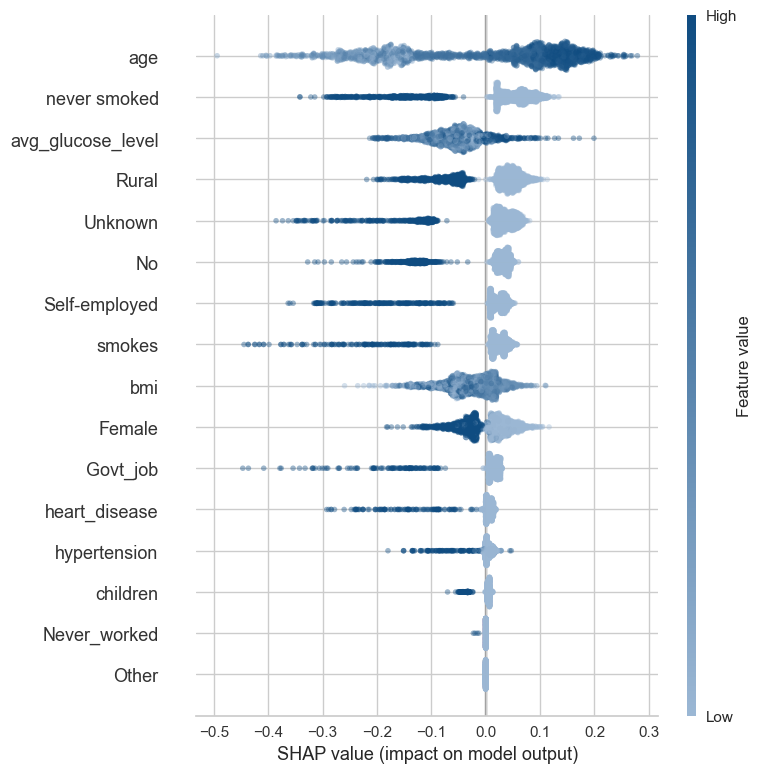

In [58]:
import shap  
!pip install matplotlib

import matplotlib

explainer = shap.TreeExplainer(rfc)
shap_values = explainer.shap_values(X_test_resh)

# custom colour plot
colors = ["#9bb7d4", "#0f4c81"]           
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
shap.summary_plot(shap_values[1], X_test_resh,cmap=cmap,alpha=0.4)

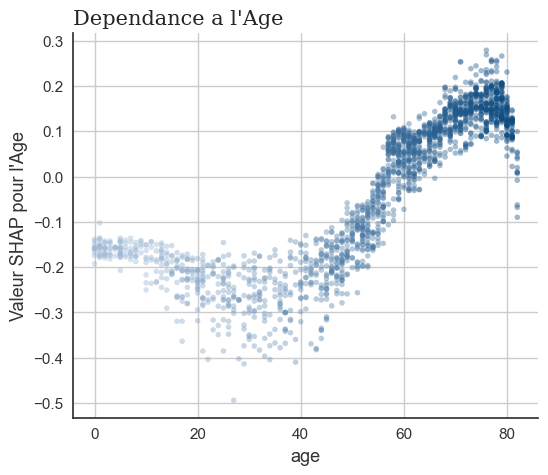

In [59]:
shap.dependence_plot('age', shap_values[1], X_test_resh, interaction_index="age",cmap=cmap,alpha=0.4,show=False)
plt.title("Dependance a l'Age",loc='left',fontfamily='serif',fontsize=15)
plt.ylabel("Valeur SHAP pour l'Age")
plt.show()

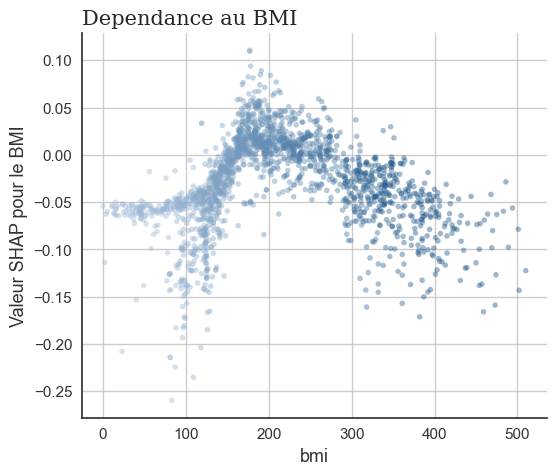

In [60]:
shap.dependence_plot('bmi', shap_values[1], X_test_resh, interaction_index="bmi",cmap=cmap,alpha=0.4,show=False)
plt.title("Dependance au BMI",loc='left',fontfamily='serif',fontsize=15)
plt.ylabel("Valeur SHAP pour le BMI")
plt.show()

In [61]:
from lime import lime_tabular
import numpy as np

# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_resh),
                                               feature_names=X_train.columns,
                                               class_names=['Not Diagnosed', 'Diagnosed'],
                                               mode='classification')

# Choose a specific instance from the test set for which you want to explain the prediction
instance_index = 0  # Replace with the index of the instance you want to explain
instance = X_test_resh.iloc[instance_index]

# Convert the Random Forest Classifier's predict_proba function to a function that takes a 2D array as input
predict_proba_fn = lambda x: rfc.predict_proba(x)

# Explain the prediction for the chosen instance
explanation = explainer.explain_instance(data_row=instance.values, predict_fn=predict_proba_fn)

# Print the explanation
explanation.show_in_notebook(show_table=True)

In [69]:
from lime import lime_tabular
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Suppose you have already trained these models
models = {
    'lr': LogisticRegression(),
    'dt': DecisionTreeClassifier(),
    'rf': RandomForestClassifier(),
    'ada': AdaBoostClassifier(),
    'knn': KNeighborsClassifier(),
    'svm': SVC(probability=True)
}

# Train the models
for model_name, model in models.items():
    model.fit(X_train_resh, y_train_resh)

# Create the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_resh),
                                               feature_names=X_train_resh.columns,
                                               class_names=['Not Diagnosed', 'Diagnosed'],
                                               mode='classification')

# Choose a specific instance from the test set for which you want to explain the prediction
instance_index = 0  # Replace with the index of the instance you want to explain
instance = X_test_resh.iloc[instance_index]

# Explain the prediction for each model
for model_name, model in models.items():
    # Convert the model's predict_proba function to a function that takes a 2D array as input
    predict_proba_fn = lambda x: model.predict_proba(x)
    
    # Explain the prediction for the chosen instance
    explanation = explainer.explain_instance(data_row=instance.values, predict_fn=predict_proba_fn)
    
    # Print the explanation
    print(f"Explanation for {model_name}:")
    explanation.show_in_notebook(show_table=True)


Explanation for lr:
Explanation for dt:


Explanation for rf:


Explanation for ada:


Explanation for knn:


Explanation for svm:


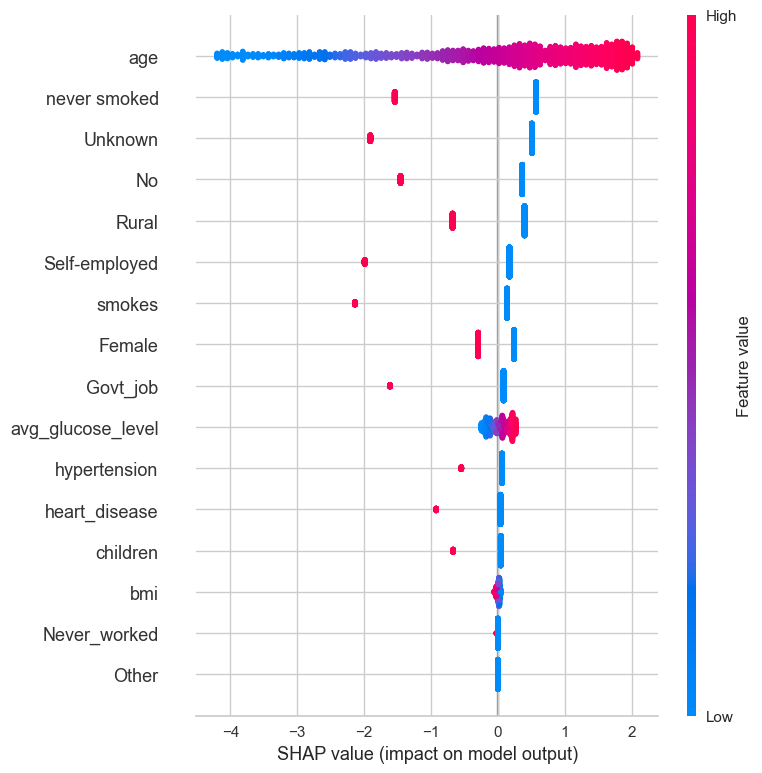

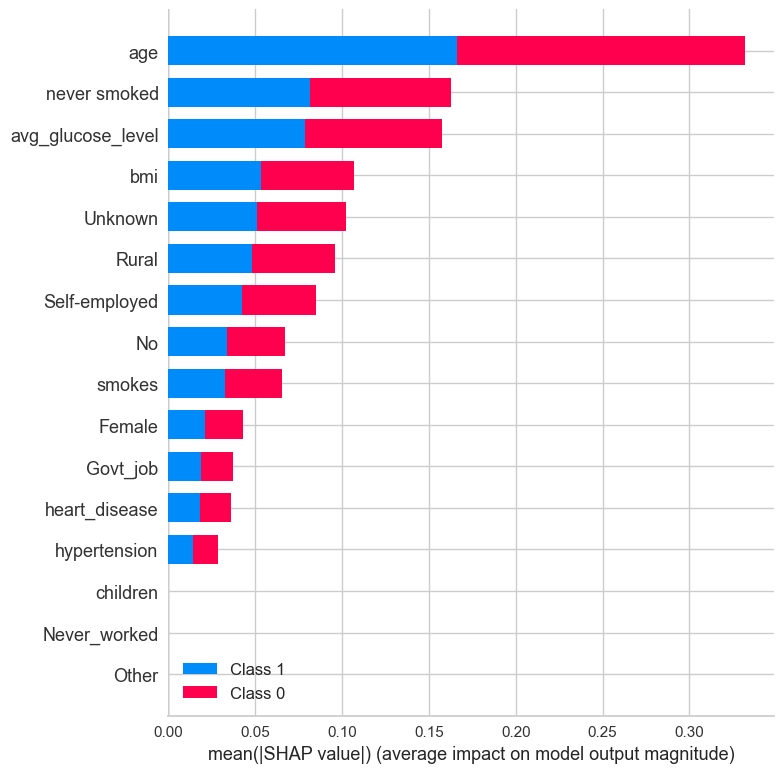

In [86]:
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Suppose you have already trained these models
models = {
    'lr': LogisticRegression(),
    'dt': DecisionTreeClassifier(),
   
}

# Train the models (assuming you've already split your data into X_train, X_test, y_train, y_test)
for model_name, model in models.items():
    model.fit(X_train_resh, y_train_resh)
    
    # Create a SHAP explainer using the model's predict_proba function
    explainer = shap.Explainer(model, X_train_resh)
    
    # Choose a specific instance from the test set for which you want to explain the prediction
    instance_index = 0  # Replace with the index of the instance you want to explain
    instance = X_test_resh.iloc[instance_index]
    
    # Get SHAP values for the chosen instance
    shap_values = explainer.shap_values(X_test_resh)
    
    # Plot the SHAP summary plot
    shap.summary_plot(shap_values, X_test_resh)
